In [1]:
# Import necessary libraries and packages
from matplotlib.patches import RegularPolygon
import matplotlib.pyplot as plt
import numpy as np
from numpy import *
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
import pandas as pd

In [2]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

# **ACTIVITY 1.1 : IMAGE DIY**

## **Sinusoid**

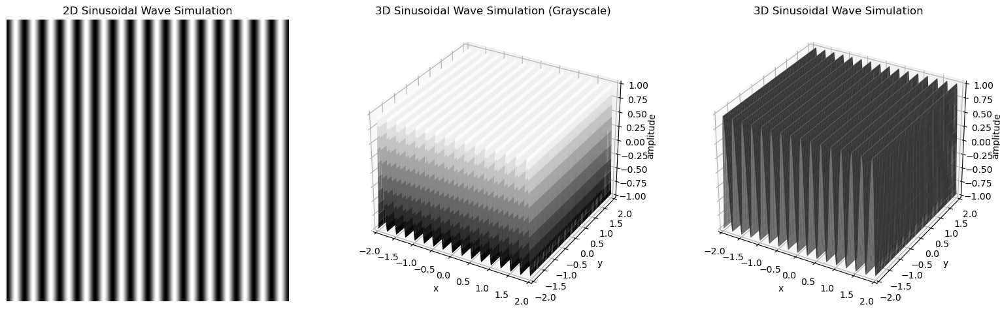

In [3]:
# Define variables
N = 400                     # set pixels [400x400]
f = 4                       # frequency [4 cycles/cm]
x = linspace(-2,2,N)        # (-2,2) bounds with 200 evenly spaced points
y = x                       # x is the same as y (4x4 image)
x,y = meshgrid(x,y)         # create a grid of rectangular arrays
A1 = zeros(shape(x))        # initialize amplitude array which is just the z values for 3d plotting

# Solve for the values in the amplitude array
for i in range(N):
  A1[:,i] = 2*(((sin(4*pi*f*i/N))**2) - 0.5)   # sine formula with centered amplitude at z = 0

# Define figure
fig = plt.figure(figsize=plt.figaspect(0.3), layout = 'tight')
fig.set_tight_layout(True)

# First subplot
# 2D projection
ax = fig.add_subplot(131)
ax.imshow(A1, cmap = 'gray')
plt.axis('off')
plt.title("2D Sinusoidal Wave Simulation")

# Second subplot
# 3D projection (spatial)
# grayscale visualization
# we can visualize how the 2D projection is plotted by viewing this subplot from above
# white is the max grayscale value while black is the min grayscale value
ax = fig.add_subplot(132, projection='3d')
ax.set_xlabel('x')
ax.set_xlim(-2.0, 2.0)
ax.set_ylabel('y')
ax.set_ylim(-2.0, 2.0)
ax.set_zlabel('amplitude')
ax.zaxis.labelpad=1.5
ax.set_zlim(-1.00, 1.00)
plt.title("3D Sinusoidal Wave Simulation (Grayscale)")
ax.plot_surface(x, y, A1, cstride=1, rstride=7, cmap = 'gray')

# Third subplot
# 3D projection (spatial)
# general visualization with solid color
ax = fig.add_subplot(1, 3, 3, projection='3d')
ax.set_xlabel('x')
ax.set_xlim(-2.0, 2.0)
ax.set_ylabel('y')
ax.set_ylim(-2.0, 2.0)
ax.set_zlabel('amplitude')
ax.zaxis.labelpad=1.5
ax.set_zlim(-1.00, 1.00)
plt.title("3D Sinusoidal Wave Simulation")
ax.plot_surface(x, y, A1, cstride=1, rstride=7, color = 'gray')

plt.savefig('/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/ACT1/sine1.png', dpi=300, bbox_inches='tight', transparent = True)

**As we can see from the figures above, we have successfully simulated a sinusoidal wave with a frequency of 4 cycles per cm. A better visualization can be seen in the 3D plot where the z values denote the amplitude of the wave. For the sine wave equation, we have chosen an amplitude of 2 to center the graph at the origin in between the peaks [-1,1]. In the middle, we can visualize how the sinusoid is projected onto the 2D space by viewing the 3D grayscale simulation from above. Since in grayscale, black corresponds to the min value and white corresponds to the max value, the mid-ranges correspond to the grays in between. Thus, the sinusoidal grating appears to be blurry since the wave has to reach these grays before reaching the global minimum and maximum of the projection.**

In [4]:
# Since our data type (A) is float64, we have to convert it to uint8 which is a data type that contains integers from 0 to 255
# This ensures that the negative values from our amplitude array are eliminated
# First, we normalize our data by mapping our data range [min,max] to [0,255]
A_min = np.min(A1)
A_max = np.max(A1)
A_range = A_max - A_min
scale = 255.0/A_range                  # normalization factor
new_A = (A1 - A_min)*scale
A_uint8 = new_A.astype('uint8')        # converting

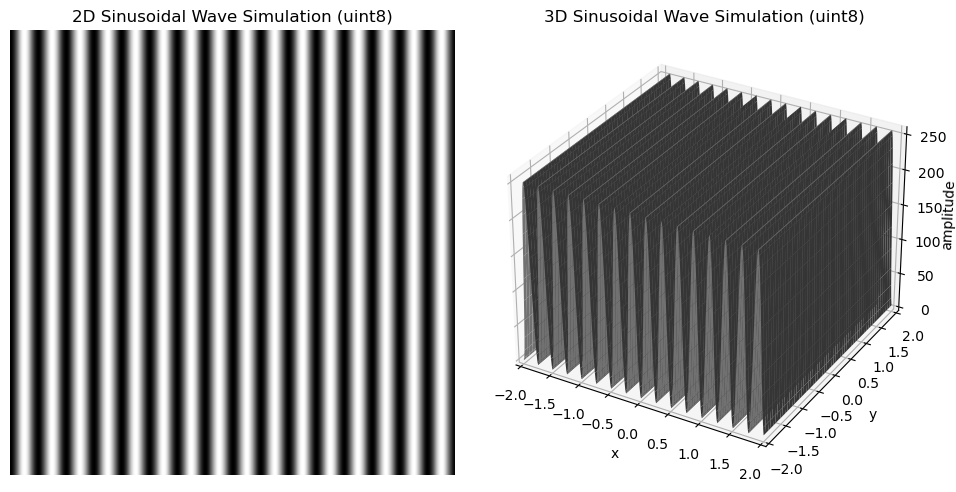

In [5]:
# Figure parameters
fig = plt.figure(figsize=plt.figaspect(0.5), layout = 'tight')
# First subplot
# 2D projection of normalized sine wave
ax = fig.add_subplot(121)
ax.imshow(A_uint8, cmap = 'gray')
plt.axis('off')
plt.title("2D Sinusoidal Wave Simulation (uint8)")

# Second subplot
# general 3D projection of normalized sine wave
ax = fig.add_subplot(1, 2, 2, projection='3d')
ax.set_xlabel('x')
ax.set_xlim(-2.0, 2.0)
ax.set_ylabel('y')
ax.set_ylim(-2.0, 2.0)
ax.set_zlim(0, 255)
ax.set_zlabel('amplitude')
ax.zaxis.labelpad=-0.5
plt.title("3D Sinusoidal Wave Simulation (uint8)")
ax.plot_surface(x, y, A_uint8, cstride=1, rstride=7, color = 'gray')

plt.savefig('/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/ACT1/sine(uint8).png', dpi=300, bbox_inches='tight', transparent = True)

**As we can see from above, mapping out the array of amplitude values to uint8 yielded a 3D graph with amplitude values having [0,255]. This was made possible since we normalized each value of z to a factor of 255.**

## **Grating**

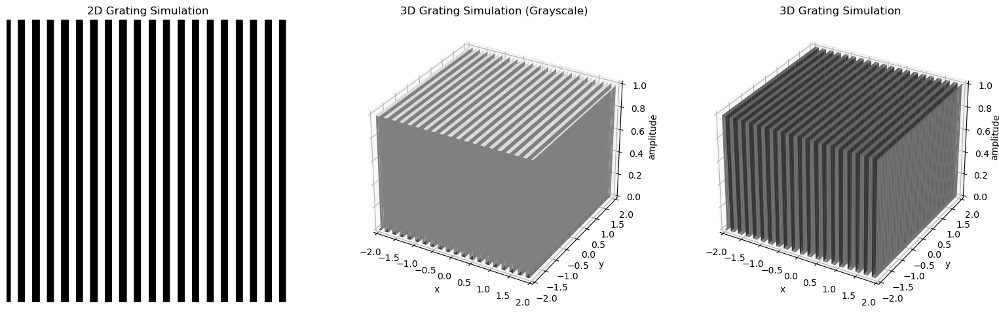

In [6]:
# Define variables
N = 400                     # set pixels [400x400]
f = 5                       # frequency [5 line pairs/cm]
x = linspace(-2,2,N)        # bounds with 400 evenly spaced points
y = x                       # x is the same as y (4x4 image)
x,y = meshgrid(x,y)         # create a grid of rectangular arrays
A2 = zeros(shape(x))        # initialize array which is just the amplitude values

# Solve for the values in the amplitude array
for i in range(N):
  A2[:,i] = round((sin(3.9*pi*f*i/N))**2)     
  # this formula evens and sharpens out the sine wave by rounding the resulting amplitude to the nearest integer

# Figure parameters
fig = plt.figure(figsize=plt.figaspect(0.3), layout = 'tight')
fig.set_tight_layout(True)

# First subplot
# 2D projection
ax = fig.add_subplot(131)
ax.imshow(A2, cmap = 'gray')
plt.axis('off')
plt.title("2D Grating Simulation")

# Second subplot
# 3D projection (spatial)
# grayscale visualization
# again, white is the max value while black is the min value
ax = fig.add_subplot(1, 3, 2, projection='3d')
ax.set_xlabel('x')
ax.set_xlim(-2.0, 2.0)
ax.set_ylabel('y')
ax.set_ylim(-2.0, 2.0)
ax.set_zlabel('amplitude')
ax.zaxis.labelpad=1.5
ax.set_zlim(0.00, 1.00)
plt.title("3D Grating Simulation (Grayscale)")
ax.plot_surface(x, y, A2, cstride=1, rstride=7, cmap = 'gray')

# Third subplot
# 3D projection (spatial)
# general visualization
ax = fig.add_subplot(1, 3, 3, projection='3d')
ax.set_xlabel('x')
ax.set_xlim(-2.0, 2.0)
ax.set_ylabel('y')
ax.set_ylim(-2.0, 2.0)
ax.set_zlabel('amplitude')
ax.zaxis.labelpad=-0.9
ax.set_zlim(0.00, 1.00)
plt.title("3D Grating Simulation")
ax.plot_surface(x, y, A2, cstride=1, rstride=7, color = 'gray')

plt.savefig('/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/ACT1/squaregrating.png', dpi=300, bbox_inches='tight', transparent = True)

**As we can see above, we have successfully simulated grating in both 2D and 3D spaces with a frequency of 5 line pairs per cm. In 2D, the simplest grating can be observed by a large number of evenly spaced parallel slits through a rounded sinusoid essentially acting as a square wave equation. Unlike in the previous sine wave grating, the square wave grating has solid white and solid black line pairs, characterized by sharp edges. This can be confirmed by looking at our 3D grayscale visualization in the middle which shows square waves from the rounded values of the sinusoid. Since the wave instantaneously jumps from its lowest peak to its highest at a singular point, the resulting 2D projection would look solid unlike the blurry 2D projection of a regular sine wave. Thus, the wave does not need to reach the mid-ranges corresponding to the rest of the gray intensities anymore.**

## **Hubble's Primary Mirror Simulation**

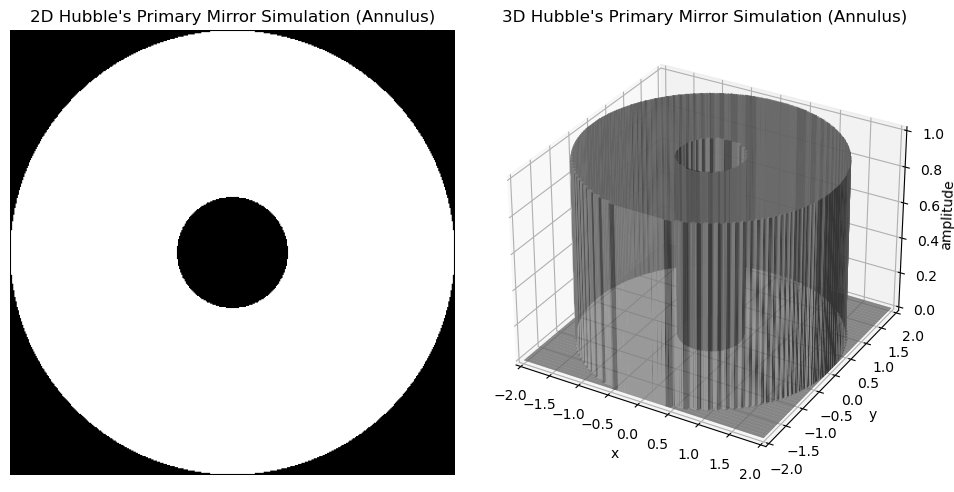

In [7]:
# Define variables
N = 400                        # set pixels [400x400]
x = linspace(-2,2,N)           # bounds with 400 evenly spaced points
y = x                          # x is the same as y (4x4 image)
x,y = meshgrid(x,y)            # create a grid of rectangular arrays
R = sqrt(x**2 + y**2)          # sqrt of circle formula centered at the origin gives radius
A3 = zeros(shape(x))           # amplitude

# Constructing the annulus
# Since we want the ring to be small, we specify a range that takes an amplitude value and set the rest to zero
for i in range(N):
  for j in range(N):
    if R[i,j]>0.5 and R[i,j]<2:       # if 0.5 < radius < 2
      A3[i,j] = 1.0                   # fill in the array with 1.0
                                      # the rest are already zero since this is a zeros array

# Figure parameters
fig = plt.figure(figsize=plt.figaspect(0.5), layout = 'tight')
fig.set_tight_layout(True)
# First subplot
# 2D projection
ax = fig.add_subplot(121)
ax.imshow(A3, cmap = 'gray')
plt.axis('off')
plt.title("2D Hubble's Primary Mirror Simulation (Annulus)")

# Second subplot
# 3D projection (spatial)
# general visualization
ax = fig.add_subplot(122, projection='3d')
ax.set_xlabel('x')
ax.set_xlim(-2.0, 2.0)
ax.set_ylabel('y')
ax.set_ylim(-2.0, 2.0)
ax.set_zlabel('amplitude')
ax.zaxis.labelpad=-0.9
ax.set_zlim(0.00, 1.00)
plt.title("3D Hubble's Primary Mirror Simulation (Annulus)")
ax.plot_surface(x, y, A3, cstride=1, rstride=7, color = 'gray')

plt.savefig('/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/ACT1/annulus.png', dpi=300, bbox_inches='tight', transparent = True)

**As we can see from above, we have successfully simulated Hubble's Primary Mirror which closely resembles an annulus. The behavior of the grayscale intensities is even more apparent here since we can definitely see that all blacks are set to the global minimum of 0.0 while all whites are set to the global maximum of 1.0.**

## **Hexagon Array (JWST Primary Mirror Simulation)**

In [8]:
# Define the space for plotting
# Plots is just an arbitrary array of (x,y,z) points
# Occupied is just a binary dictionary for determining colors
def space(plots, occupied):
    coord = plots                                                                 # store plots in localized coord variable because we do not want to modify plots 
    colors = ["white" if k == 0 else "yellow" for k in occupied.values()]         # white if element in occupied dictionary is 0; yellow if otherwise
 
# Horizontal coordinates array
    hcoord = [c[0] for c in coord]                                                # first element of the first element in plots array is the horizontal coordinate

# Vertical coordinates array
    vcoord = [2.*sin(radians(60))*(c[1]-c[2])/3. for c in coord]                  # modified hexagon apothem formula is applied on every element in plots array to get the vertical coordinate
                                                                                  # this converts the (y,z) coordinates into the y cartesian coordinates in matplotlib
# Set figure and axis using subplots
    fig, ax = plt.subplots(1, figsize=(5,5))
    ax.set_aspect('equal')                                                        # set equal aspect ratio

    # Loop through tuples of zipped hcoord, vcoord, and colors
    for i, j, k in zip(hcoord, vcoord, colors):                                   # this is almost similar to the meshgrid function except that it stores these variables into tuples
        color = k[0]                                                              # starts with first element in occupied values
        hex = RegularPolygon((i, j), numVertices=6, radius=2./3,                  # define hexagon, 6 vertices
                             orientation=radians(30), facecolor = color,          # rotate the hexagon for appropriate orientation
                             alpha=0.3, edgecolor='k')
        ax.add_patch(hex)                                                         # draws patch of colored hexagon

    # Add scatter points in hexagon centers for reference
    ax.scatter(hcoord, vcoord, alpha=0)
    # Show plot
    plt.title("JWST Primary Mirror Simulation (n=3)")
    plt.axis('off')
    plt.savefig('/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/ACT1/hexa.png', dpi=300, transparent = True)
    plt.show()

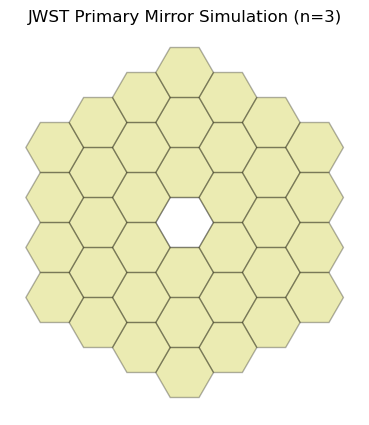

In [9]:
# The following array and dictionary values may be modified to generate different hexagonal array plots

# Hexagon coordinates
# For this part, I am demonstrating what I have specified in my powerpoint: that you can add multiple
# layers of hexagons to the function by specifying these coordinates
# Specifically, I have chosen to demonstrate n = 3 layers
plots = [[0,0,0], 
         [0,1,-1], 
         [-1,1,0], 
         [-1,0,1], 
         [0,-1,1], 
         [1,-1,0], 
         [1,0,-1],
         [0,5.5,1.5],
         [1,4,1],
         [2,2.5,0.5],
         [2,0.5,0.5],
         [2,-1.5,0.5],
         [1,-2,1],
         [0,-2.5,1.5],
         [-1,-2,1],
         [-2,-1.5,0.5],
         [-2,0.5,0.5],
         [-2,2.5,0.5],
         [-1,4,1],
         [-3,-1,0],
         [-3,1,0],
         [-3,3,0],
         [-2,5,1],
         [-1,7,2],
         [0,10,4],
         [1,9,4],
         [2,7,3],
         [3,5,2],
         [3,3,2],
         [3,1,2],
         [3,-1,2],
         [2,-1,3],
         [1,-1,4],
         [0,-1,5],
         [-1,1,6],
         [-2,3,7],
         [-3,5,8]

         ]

# Dictionary of values containing which cells are occupied
# Values are 1 if occupied (yellow), 0 if not (white)
# Does not matter what you name the keys, the function ignores the names
# Needs to have the same amount of entries as plots for function to work
occupied = {
    "center": 0, 
    "a": 1,
    "b": 1,
    "c": 1,
    "d": 1,
    "e": 1,
    "f": 1,
    "g": 1,
    "h": 1,
    "i": 1,
    "j": 1,
    "k": 1,
    "l": 1,
    "m": 1,
    "n": 1,
    "o": 1,
    "p": 1,
    "q": 1,
    "r": 1,
    "s": 1,
    "t": 1,
    "u": 1,
    "v": 1,
    "w": 1,
    "x": 1,
    "y": 1,
    "z": 1,
    "aa": 1,
    "bb": 1,
    "cc": 1,
    "dd": 1,
    "ee": 1,
    "ff": 1,
    "gg": 1,
    "hh": 1,
    "ii": 1,
    "jj": 1
}

# Call for function
space(plots, occupied)

**As we can see from above, we have successfully simulated the JWST Primary Mirror with hexagonal arrays. Much of the code and math has already been explained in the cells. Note that by the structure of the function, we can further extend the hexagonal array and make the mirror bigger just by inputting extra coordinates.**

# **ACTIVITY 1.2 : COLOR IMAGE**

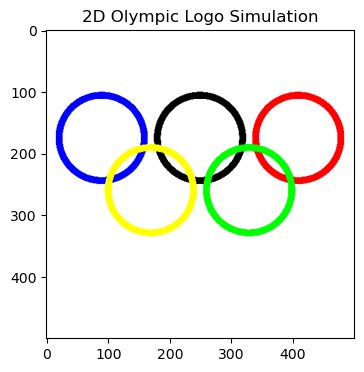

In [10]:
# Define variables 
# We note that RGB follows this convention: R --- (255, 0, 0), G --- (0, 255, 0), B --- (0, 0, 255)
N = 500                                                               # pixels                                                                
x = linspace(-10,10,num = N)                                          # bounds with 500 evenly spaced points
y = x                                                                 # x is the same as y
X,Y = meshgrid(x,y)                                                   # create a grid of rectangular arrays
Rd, Gn, Bl = zeros((N,N)), zeros((N,N)), zeros((N,N))                 # Initialize arrays for each R, G, B

# Construct the white background
# R + G + B = white
# All elements are set to 1.0 which equals 255 when read by imshow package
Rd[...] = 1.0
Gn[...] = 1.0
Bl[...] = 1.0

# Construct the colored circles
Rt, Rc, deg = 3, 3, 30
xt, yt = Rt*cos(deg*pi/180) + 0.6, Rt*sin(deg*pi/180) - 1.1
# Factors have been summed/subtracted to get the appropriate translation along
# the horizontal and vertical axes

# Next, we construct the individual circles on their appropriate plots
# We use the same algorithm as before where we set the value of the color to 1.0
# when we want it to appear on the plot.
# The if statement specifies where the color will go while the rest are just white
# because we have already set the background to white in the previous lines
R = sqrt((X+2*xt)**2 + (Y+Rt)**2)
for i in range(N):
  for j in range(N):
    if R[i,j]>2.55 and R[i,j]<Rc:
      Rd[i,j] = 0.0
      Gn[i,j] = 0.0                           # blue
      Bl[i,j] = 1.0

R = sqrt((X)**2 + (Y+Rt)**2)                  # horizontal translation to the right wrt previous
for i in range(N):
  for j in range(N):
    if R[i,j]>2.55 and R[i,j]<Rc:
      Rd[i,j] = 0.0                           # black
      Gn[i,j] = 0.0
      Bl[i,j] = 0.0

R = sqrt((X-2*xt)**2 + (Y+Rt)**2)             # horizontal translate to the right
for i in range(N):
  for j in range(N):
    if R[i,j]>2.55 and R[i,j]<Rc:
      Rd[i,j] = 1.0                           # red
      Gn[i,j] = 0.0
      Bl[i,j] = 0.0

R = sqrt((X+xt)**2 + (Y-yt)**2)               # horizontal and vertical translation
for i in range(N):
  for j in range(N):
    if R[i,j]>2.55 and R[i,j]<Rc:
      Rd[i,j] = 1.0
      Gn[i,j] = 1.0                           # yellow: red + green
      Bl[i,j] = 0.0

R = sqrt((X-xt)**2 + (Y-yt)**2)               # horizontal translation wrt previous
for i in range(N):
  for j in range(N):
    if R[i,j]>2.55 and R[i,j]<Rc:
      Rd[i,j] = 0.0
      Gn[i,j] = 1.0                           # green
      Bl[i,j] = 0.0

# Construct the overall image
# Since I is 3D, each dimensional plane contains R, G, B in that order
# The first plane is red, second is green, third is blue
# This is the order that matplotlib's imshow recognizes to create RGB on screen
I = zeros((N,N,3))
I[...,0] = Rd
I[...,1] = Gn
I[...,2] = Bl
fig = plt.figure(figsize=(4,4))
plt.title("2D Olympic Logo Simulation")
plt.imshow(I)
plt.show()

In [11]:
# Save the image as various image types
rgbim = I*255
img = rgbim.astype(np.uint8)
plt.imsave('/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/ACT1/olympic.bmp', img)
plt.imsave('/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/ACT1/olympic.jpg', img)
plt.imsave('/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/ACT1/olympic.png', img)
plt.imsave('/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/ACT1/olympic.tiff', img)

**Much of the code and idea behind generating colored images is already explained within the in-line discussions.**

# **ACTIVITY 1.3: ALTERING THE INPUT-OUTPUT CURVE**

**This has been discussed in the powerpoint presentation. Please refer to it in this directory.**

# **ACTIVITY 1.4 : HISTOGRAM BACKPROJECTION ON GRAYSCALE IMAGES**

In [12]:
# Define a function that converts the image into grayscale
# (R,G,B) values are multiplied (dotted) to their respective weights
# i.e. 0.2989 for red, 0.5870 for green, and 0.1140 for blue
# This weighted average determines the brightness of the 'gray' values
# This will be more apparent later when we separate each color channel
def rgb2gray(rgb):
  return dot(img[...,:3], [0.2989, 0.5870, 0.1140])

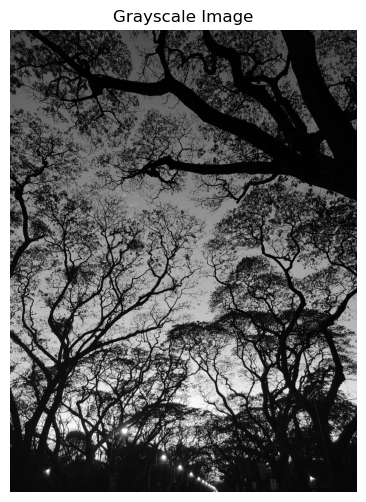

In [13]:
# Read image from the jpg file into an array then store into a variable
img = plt.imread('/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/Gimp Files/Tree/treefinalgimp.jpg')

# Convert the image into grayscale
grayscale = rgb2gray(img)

# Plot image
plt.figure(figsize = [27,6])
plt.title("Grayscale Image")
plt.axis('off')
plt.imshow(grayscale, cmap='gray')

plt.imsave('/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/Act1/origgrayscale.png', grayscale, cmap='gray')

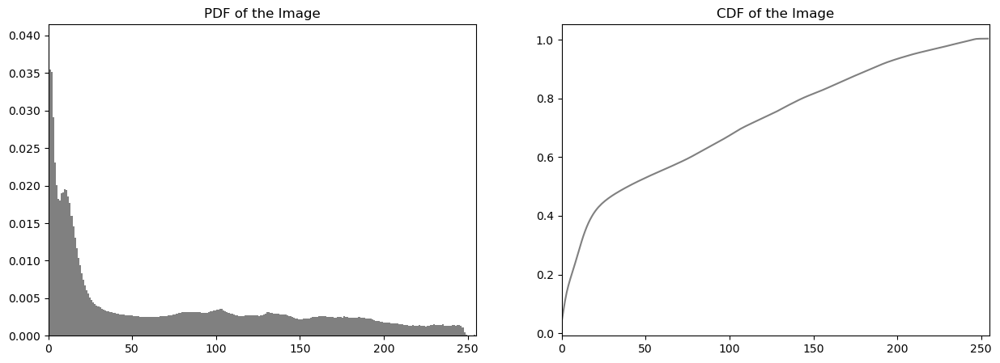

In [14]:
# Normalize the pixel intensities by the number of pixels assuming that specific intensity
grayscale1 = 255*grayscale/grayscale.max()
# Store histogram values and bin edges in variables for convenience
hist, bin_edges= np.histogram(grayscale1, bins = 256, density=True)
# Take the CDF of the normalized histogram values
CDF = np.cumsum(hist)

# Figure parameters
plt.figure(figsize = [15,5])

# First subplot
# PDF of the image
plt.subplot(121)
plt.title("PDF of the Image")
plt.xlim(0,255)
plt.bar(bin_edges[:-1], hist, width=1, color='gray')

# Second subplot
# CDF of the image
plt.subplot(122)
plt.title("CDF of the Image")
plt.xlim(0,255)
plt.plot(bin_edges[:-1], CDF, color='gray')

plt.savefig('/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/Act1/origpdfcdf.png', dpi=300)
plt.show()

**We can visualize the normalized number of pixels assuming a specific grayscale value by viewing the PDF of the image. We can make observations regarding the percentile distribution of pixels assuming a specific grayscale value by viewing the CDF of the image. More of this was discussed in the powerpoint presentation located in this directory.**

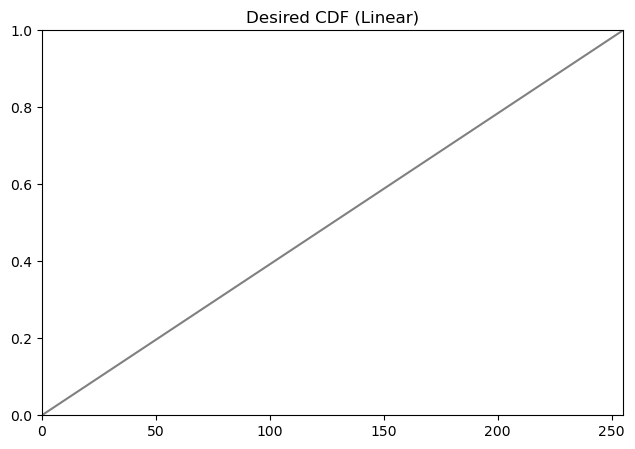

In [15]:
# Next, we construct a linear CDF which serves as the desired CDF
# This is basically just a linear function
x = np.arange(0,256)                 # intensities
y = np.linspace(0,1,256)             # number of pixels

# Figure parameters
plt.figure(figsize = [7.5,5])
plt.title("Desired CDF (Linear)")
plt.xlim(0,255)
plt.ylim(0,1)
plt.plot(x, y, color='gray')
plt.show()

In [16]:
# Convert the data type to int
newgray = grayscale1.astype(int)

# Assign variables for the old and new x values for the look-up routine
oldx = x               # old intensity values [0:255]  
newx = CDF*255         # new intensity values with scaling factor

# Flatten out the 2D graydf array into 1D then store in a variable
flat = newgray.ravel()

# Search for indices where the values from the flattened array may be inserted into the old x values array while maintaining order
# These indices will serve as the look-up guide for interpolating
idx = np.searchsorted(oldx, flat)

# Replace the old intensity values by the new x values using the new indexing algorithm
flat[:] = newx[idx]

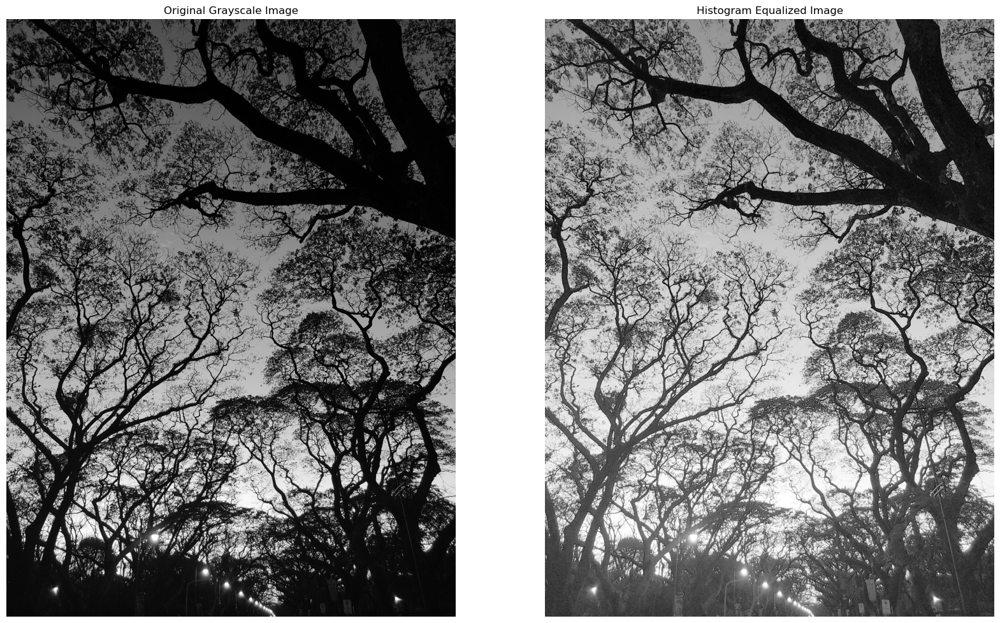

In [17]:
# Figure parameters
plt.figure(figsize = [20,15])

# First subplot for the original grayscale image
plt.subplot(121)
plt.title("Original Grayscale Image")
plt.imshow(grayscale1, cmap = 'gray')
plt.axis('off')
# Second subplot for the histogram equalized image
plt.subplot(122)
plt.title("Histogram Equalized Image")
plt.imshow(newgray, cmap = 'gray')
plt.axis('off')
plt.savefig('/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/Act1/lineartreeduo.png', dpi=300, transparent=True)
plt.show()

**As we can see from above, we have successfully enhanced the low-light image through histogram equalization using a linear CDF.**

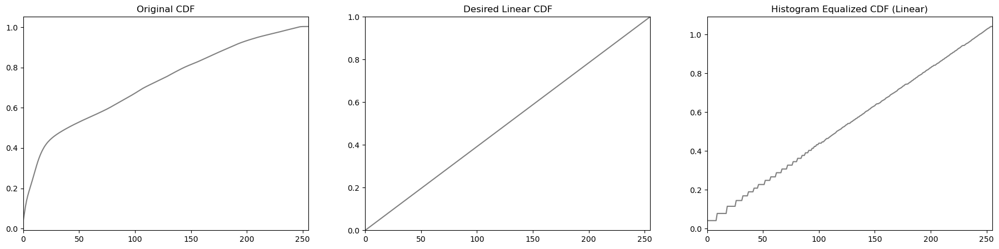

In [18]:
# Next, we get the updated CDF of the enhanced image
# We do the same plotting technique as before
hist1, bin_edges1 = np.histogram(newgray, bins = 256, density=True)
x = np.arange(0,256)                 # intensities
y = np.linspace(0,1,256)             # number of pixels

# Updated CDF
CDF1 = np.cumsum(hist1)                 

# Figure parameters
plt.figure(figsize = [22.5,5])

# First subplot
# Original CDF
plt.subplot(131)
plt.plot(x, CDF, color='gray')
plt.xlim(0,255)
plt.title("Original CDF")

# Second subplot
# Desired CDF
plt.subplot(132)
plt.plot(x, y, color='gray')
plt.xlim(0,255)
plt.ylim(0,1)
plt.title("Desired Linear CDF")

# Third Subplot
plt.subplot(133)
plt.plot(x, CDF1, color='gray')
plt.xlim(0,255)
plt.title("Histogram Equalized CDF (Linear)")

plt.savefig('/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/Act1/CDFlinearcomparisons.png', dpi=300, transparent=True)
plt.show()

**We further verify that we have successfully projected our original CDF linearly by the figure above.**

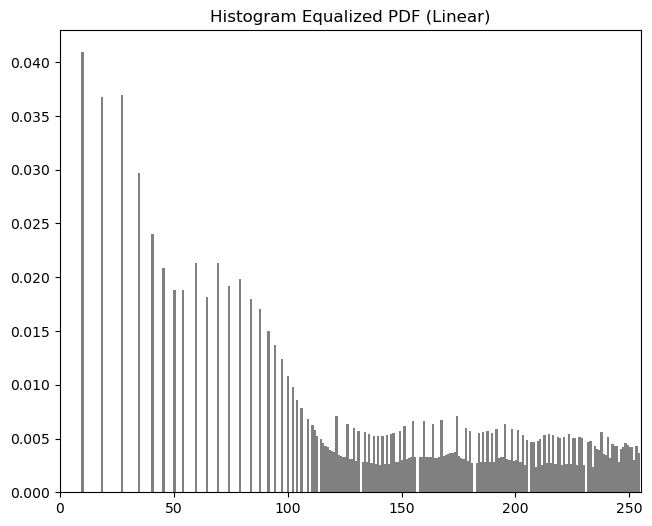

In [19]:
# Finally, we get the updated PDF of the enhanced image
# Figure Parameters
plt.figure(figsize=[7.5,6])

# Plot
plt.bar(bin_edges1[:-1], hist1, width=1, color='gray')
plt.xlim(0,255)
plt.title("Histogram Equalized PDF (Linear)")

plt.savefig('/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/Act1/linearpdf.png', dpi=300, transparent=True)
plt.show()

**We conclude the histogram equalization using a linear CDF by demonstrating its PDF above. The pixel distribution is now fairly equalized across the grayscale intensities.**

In [21]:
# Next, we implement a new CDF by a sigmoid function
# The sigmoid function is useful in ANNs since they introduce non-linearity into the model
# More of this is discussed in the powerpoint presentation
def sigmoid_func(X):
    return 1 / (1 + np.exp((a-X)/15))

def inverse_sigmoid(Y):
    return a - 15*np.log(abs((1/Y)-1))

# Constructing the arrays for the x and y values
sigmoid_x = np.arange(0,256)
a = np.median(sigmoid_x)
sigmoid_y = sigmoid_func(sigmoid_x)

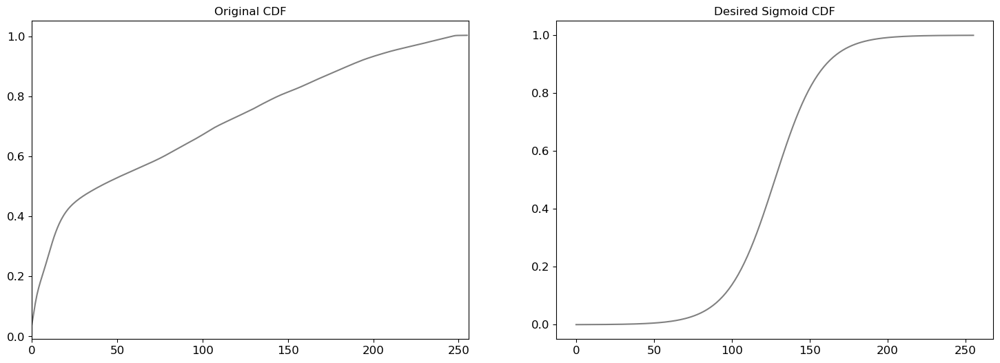

In [22]:
# We implement the same plotting techniques as before
Values = np.arange(0,256)

plt.figure(figsize = [9*2,6])
plt.subplot(121)
plt.title("Original CDF")
plt.plot(Values, CDF, color='gray')
plt.xlim(0,256)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.subplot(122)
plt.title("Desired Sigmoid CDF")
plt.plot(sigmoid_x, sigmoid_y, color='gray')
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.savefig('/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/Act1/sigmoidcdf.png', dpi=300, transparent=True)
plt.show()

In [23]:
# Store histogram values and bin edges in variables for convenience
hist, bin_edges = np.histogram(grayscale1, bins = 256, density=True)

# Take the CDF of the normalized histogram values
CDF = np.cumsum(hist)

# Again, this is just a repetition of the previously implemented algorithms above
# Convert the data type to int
grayscale_sig = grayscale.astype(int)

# Initialize a dataframe
sig_df = pd.DataFrame()

# Store appropriate values under each column of the dataframe
sig_df['Original Grayscale Values'] = Values
sig_df['CDF Values'] = CDF
sig_df['Sigmoid Grayscale Values'] = inverse_sigmoid(CDF)

In [24]:
# Store old and new pixel values in arrays
old_val = np.array(Values)
new_val = np.array(inverse_sigmoid(CDF))

# Mask of elements to be modified
mask = np.in1d(grayscale_sig,old_val)

# Search for indices for each match in old_val array
idx1 = np.searchsorted(old_val,grayscale_sig.ravel()[mask])

# Selectively input elements under the new values array
grayscale_sig.ravel()[mask] = new_val[idx1]

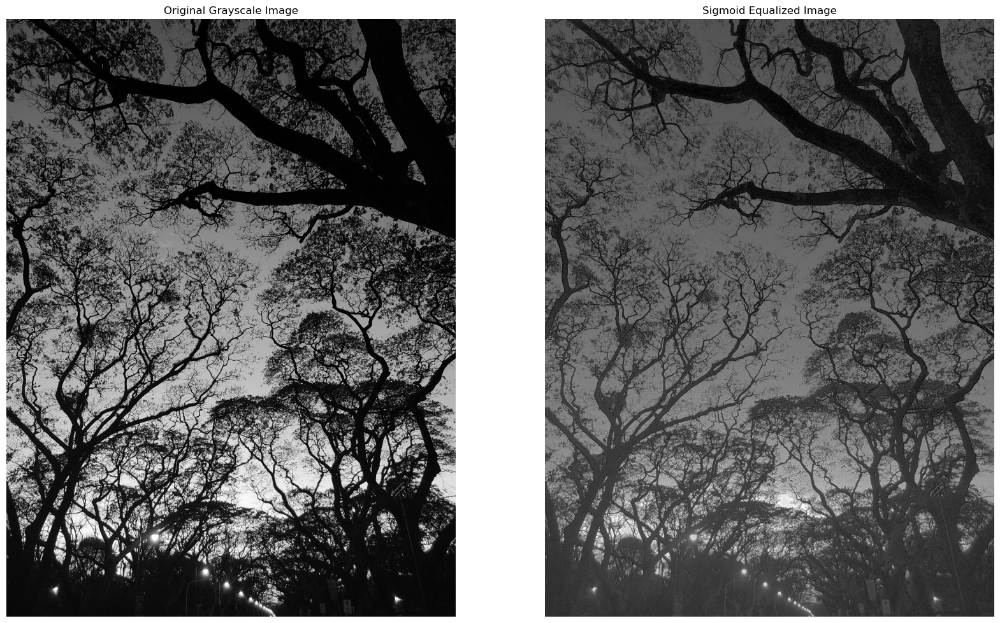

In [25]:
# Same plotting parameters
plt.figure(figsize = [20,15])

# Original grayscale image
plt.subplot(121)
plt.title("Original Grayscale Image")
plt.imshow(grayscale, cmap = 'gray')
plt.axis('off')

# Enhanced image
plt.subplot(122)
plt.title("Sigmoid Equalized Image")
plt.imshow(grayscale_sig, cmap = 'gray')
plt.axis('off')
plt.savefig('/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/Act1/desired_image_sigmoid.png', dpi = 300, bbox_inches='tight')
plt.show()

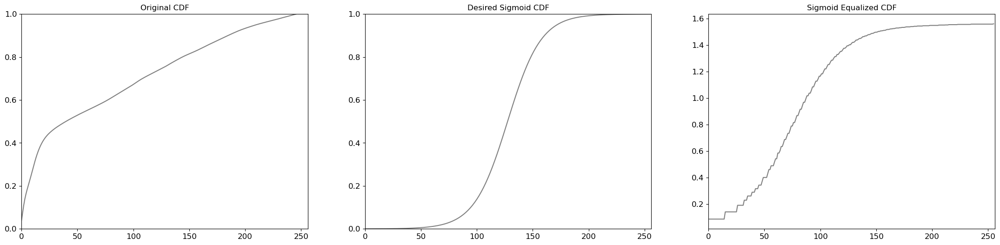

In [26]:
# We get the CDF of the updated image against the original and desired CDF
# Same binning algorithm for the new histogram
hist2, bin_edges2 = np.histogram(grayscale_sig, bins = 256, density=True)
Values_sig = np.arange(0,256)

# Taking the CDF of the updated image
CDF_sig = np.cumsum(hist2)

# Same plotting parameters
plt.figure(figsize = [27,6])

# 1st subplot for original CDF
plt.subplot(131)
plt.title("Original CDF")
plt.plot(Values, CDF, color='gray')
plt.xlim(0,256)
plt.ylim(0,1)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)

# 2nd subplot for desired sigmoid CDF
plt.subplot(132)
plt.title("Desired Sigmoid CDF")
plt.plot(sigmoid_x, sigmoid_y, color='gray')
plt.xticks(fontsize = 12)
plt.xlim(0,256)
plt.ylim(0,1)
plt.yticks(fontsize = 12)

# 3rd subplot for sigmoid equalized CDF
plt.subplot(133)
plt.title("Sigmoid Equalized CDF")
plt.plot(Values_sig, CDF_sig, color='gray')
plt.xlim(0,256)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)

plt.savefig('/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/Act1/sigmoidfinal.png', dpi=300, transparent=True)
plt.show()

**As we can see from above, the resulting CDF of the image has been successfully equalized by the sigmoid function. Its pixel values have significantly shifted to the center or median of the histogram indicating that much of the pixel intensities are now grayer.**

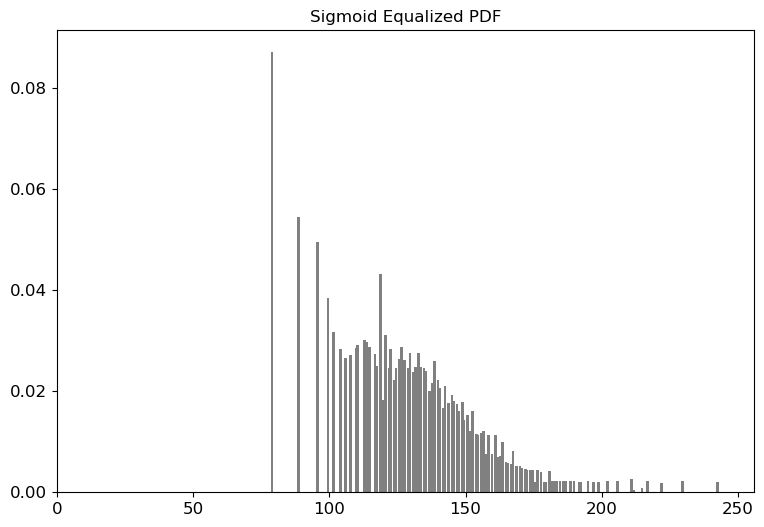

In [27]:
# Getting the updated PDF of the sigmoid equalized image
plt.figure(figsize=[9,6])
plt.title("Sigmoid Equalized PDF")
plt.bar(bin_edges2[:-1],hist2,width=1, color='gray')
plt.xlim(0,256)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)

plt.savefig('/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/Act1/sigmoidpdf.png', dpi=300, transparent=True)
plt.show()

**Visualizing the resulting PDF, we can further confirm that much of the pixel intensities now lie at the center. An in-depth explanation of the results is present in the PPT. Please refer to it for a better understanding.**

# **ACTIVITY 1.5: CONTRAST ENHANCEMENT**

In [28]:
# Define contrast stretching function
# Where x is an array of old pixel values, y is the minimum pixel intensity, and z is the maximum pixel intensity
# 255 is the scaling factor for normalization
def contrast(x,y,z):
    return ((x - y) / (z - y)) * 255

In [29]:
print(grayscale.min(), grayscale.max())

0.0 254.9745


**Since the bounds of our pixel intensities are extremely close to [0,255], standard contrast stretching will do basically nothing to the pixel values. Instead, we must select a range of min and max pixel values to contrast stretch. We call this percentile stretching.**

In [30]:
# We contrast stretch our image and specify the percentiles to be stretched
stretched1 = contrast(grayscale, grayscale.min(), grayscale.max())
stretched2 = contrast(grayscale, 1, 99)    
stretched3 = contrast(grayscale, 15, 85)
stretched4 = contrast(grayscale, 20, 75)
stretched5 = contrast(grayscale, 30, 65)

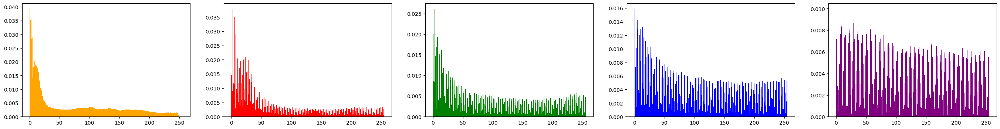

In [31]:
# Next, we plot their respective PDFs
# Initialize array of bins for every pixel
bins1 = arange(0,256)                                

# Reshape each array into a column matrix
pix1 = reshape(stretched1, (-1,1))                    
pix2 = reshape(stretched2, (-1,1))                   
pix3 = reshape(stretched3, (-1,1))                   
pix4 = reshape(stretched4, (-1,1))                    
pix5 = reshape(stretched5, (-1,1))                   

# Plotting parameters for each normalized histogram
plt.figure(figsize = [34,4])
plt.subplot(151)
PDF1 = plt.hist(pix1, bins=bins1, density=True, stacked=True, color='orange')    
plt.subplot(152)
PDF2 = plt.hist(pix2, bins=bins1, density=True, stacked=True, color='red')    
plt.subplot(153)
PDF3 = plt.hist(pix3, bins=bins1, density=True, stacked=True, color='green')   
plt.subplot(154)
PDF4 = plt.hist(pix4, bins=bins1, density=True, stacked=True, color='blue')   
plt.subplot(155)
PDF5 = plt.hist(pix5, bins=bins1, density=True, stacked=True, color='purple')    

plt.savefig('/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/Act1/contrapdf.png', dpi=300, transparent=True)
plt.show()

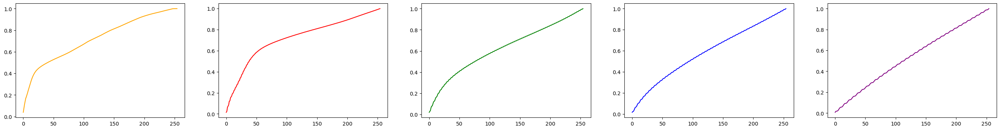

In [32]:
# Next, we take the CDF of each normalized PDF above
# Initialize array of bins for every pixel
bins2 = arange(0,255)                          

# Plotting parameters
# We simply take the cumsum of the flattened out 1D arrays above then reshape again
plt.figure(figsize = [34,4])
plt.subplot(151)
pix6 = reshape(cumsum(PDF1[0]), (-1,1))          
plt.plot(bins2, pix6, color='orange')                           
plt.subplot(152)
pix7 = reshape(cumsum(PDF2[0]), (-1,1))          
plt.plot(bins2, pix7, color='red')                           
plt.subplot(153)
pix8 = reshape(cumsum(PDF3[0]), (-1,1))          
plt.plot(bins2, pix8, color='green')                           
plt.subplot(154)
pix9 = reshape(cumsum(PDF4[0]), (-1,1))         
plt.plot(bins2, pix9, color='blue')                           
plt.subplot(155)
pix10 = reshape(cumsum(PDF5[0]), (-1,1))          
plt.plot(bins2, pix10, color='purple')                           
plt.show()

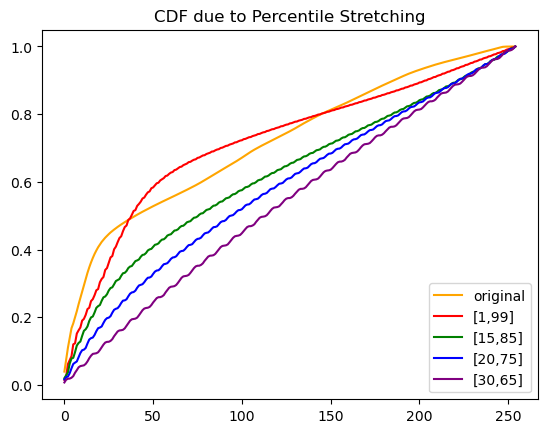

In [33]:
# Juxtapose them into one plot
plt.plot(bins2, pix6, color='orange')
plt.plot(bins2, pix7, color='red')
plt.plot(bins2, pix8, color='green')
plt.plot(bins2, pix9, color='blue')
plt.plot(bins2, pix10, color='purple')
plt.title('CDF due to Percentile Stretching')
plt.legend(['original', '[1,99]', '[15,85]', '[20,75]', '[30,65]'], loc='lower right')
plt.savefig('/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/Act1/contra.png', dpi=300, transparent=True)

plt.show()

**As we can see from above, percentile contrast stretching just linearly maps or ‘stretches’ the input values into the entire grayscale range.**

# **ACTIVITY 1.6: RESTORING FADED COLORED PHOTOGRAPHS**

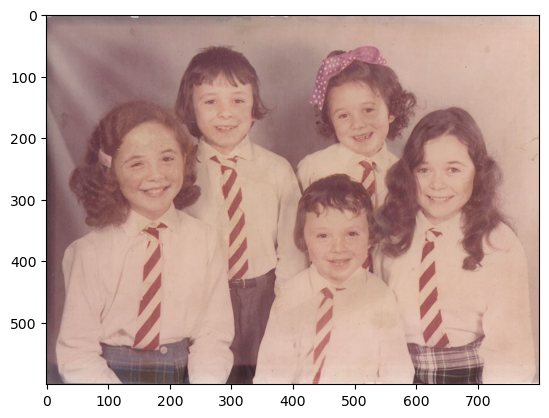

In [34]:
# Load an old image into a var
old_img = plt.imread('old3.jpg')

# Store each color channel into vars
R_orig_img = old_img[:,:,0]
G_orig_img = old_img[:,:,1]
B_orig_img = old_img[:,:,2]
plt.imshow(old_img, cmap='gray')
plt.show()

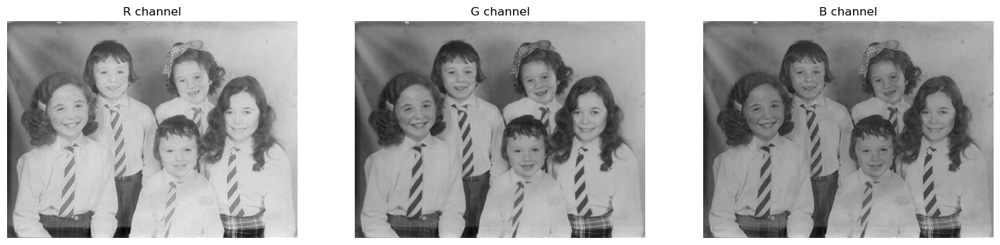

In [35]:
# Plot each color channel to determine the intensities of each R,G,B
plt.figure(figsize=[18,12])

# R channel
plt.subplot(131)
plt.imshow(R_orig_img, cmap='gray')
plt.title('R channel')
plt.axis('off')

# G channel
plt.subplot(132)
plt.imshow(G_orig_img, cmap='gray')
plt.title('G channel')
plt.axis('off')

# B channel
plt.subplot(133)
plt.imshow(B_orig_img, cmap='gray')
plt.title('B channel')
plt.axis('off')
plt.savefig('/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/Act1/graychannels.png', dpi=300, transparent=True)
plt.show()

In [37]:
print(f'R channel: {np.sum(R_orig_img)}, G channel: {np.sum(G_orig_img)}, B channel: {np.sum(B_orig_img)}')

R channel: 87997308, G channel: 70504326, B channel: 65986291


**Loading each color channel into grayscale, we can get the pixel sum for each color channel to determine how intense that color is in the original image. As we can see from above, red is the most prominent color since it has the highest intensity out of the three.**

## **Constrast Stretching**

In [38]:
# This is the same formula as before
def contrast_stretching(x):
    return ((x - x.min()) / (x.max() - x.min())) * 255.00

In [39]:
# We input each contrast stretched channel into a new 3D array
stretched_img = np.copy(old_img)                 # preserve the original dimensions
stretched_img[:,:,0] = contrast_stretching(R_orig_img)
stretched_img[:,:,1] = contrast_stretching(G_orig_img)
stretched_img[:,:,2] = contrast_stretching(B_orig_img)

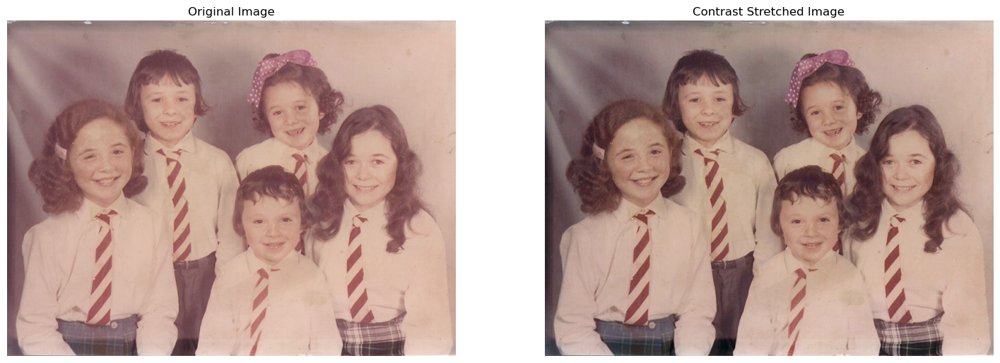

In [40]:
# Plotting the images side-by-side
plt.figure(figsize=[18,12])

# Original image
plt.subplot(121)
plt.title('Original Image')
plt.imshow(old_img)
plt.axis('off')

# Contrast stretched image
plt.subplot(122)
plt.title('Contrast Stretched Image')
plt.imshow(stretched_img)
plt.axis('off')
plt.savefig('/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/Act1/originalstretched.png', dpi = 300, bbox_inches='tight')
plt.show()

In [41]:
print(f'R channel: {np.sum(stretched_img[:,:,0])}, G channel: {np.sum(stretched_img[:,:,1])}, B channel: {np.sum(stretched_img[:,:,2])}')

R channel: 78515388, G channel: 64211409, B channel: 59809181


**As we can see from above, contrast stretching stabilized each color channel by lowering their respective intensities. However, since red still has the highest cumulative pixel value, it is still the most apparent in the resulting picture.**

## **Gray World Algorithm**

In [42]:
# Take the average of each color channel of the original image
R_ave = np.mean(R_orig_img)
G_ave = np.mean(G_orig_img)
B_ave = np.mean(B_orig_img)

# Divide each original color channel by their respective averages
R_gw = R_orig_img/R_ave
G_gw = G_orig_img/G_ave
B_gw = B_orig_img/B_ave

# Get the average of the original image
avg = np.mean(old_img)

# Scale each modified color channel by this average
# Store these values into new arrays
I_gw = np.copy(old_img)
I_gw[:,:,0] = avg*R_gw
I_gw[:,:,1] = avg*G_gw
I_gw[:,:,2] = avg*B_gw

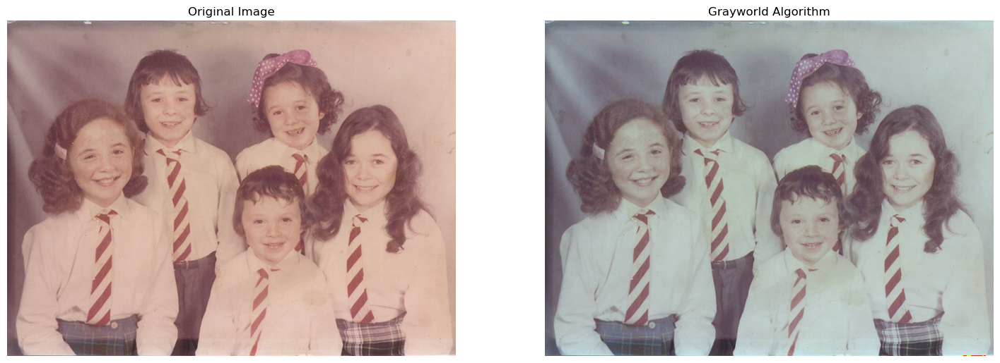

In [43]:
# Juxtaposition of the original and enhanced image through grayworld algorithm
plt.figure(figsize=[18,12])

# Original image
plt.subplot(121)
plt.title('Original Image')
plt.imshow(old_img)
plt.axis('off')

# Contrast stretched image
plt.subplot(122)
plt.title('Grayworld Algorithm')
plt.imshow(I_gw)
plt.axis('off')
plt.savefig('/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/Act1/grayworld.png', dpi = 300, bbox_inches='tight')
plt.show()

In [44]:
print(f'R channel: {np.sum(I_gw[:,:,0])}, G channel: {np.sum(I_gw[:,:,1])}, B channel: {np.sum(I_gw[:,:,2])}')

R channel: 74588723, G channel: 74580252, B channel: 74571215


**Nice! The grayworld algorithm has successfully balanced out each color channel at about ~74500000 pixel value units. The resulting image looks significantly more balanced than the original and even the previous algorithm.**

## White Patch Algorithm

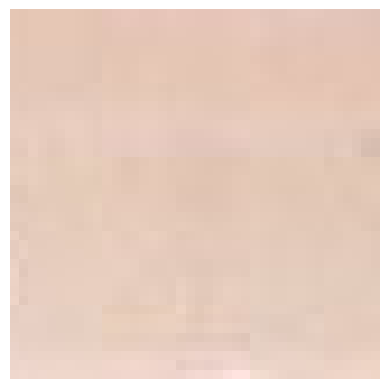

In [46]:
# First, we extract a white patch from the original image
white = old_img[560:600,470:510]

# Plot
plt.imshow(white)
plt.axis('off')
plt.savefig('/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/Act1/whitepatch.png', dpi = 300, bbox_inches='tight')

In [47]:
# Take the mean of each color channel of the white patch
# Store each into new arrays
R_wb = np.mean(white[:,:,0])
G_wb = np.mean(white[:,:,1])
B_wb = np.mean(white[:,:,2])

# Divide each original color channel with the average of each respective color channel of the white patch
Rwb = R_orig_img/R_wb
Gwb = G_orig_img/G_wb
Bwb = B_orig_img/B_wb

# Get the average of the white patch image
avg = np.mean(white)

# Scale each modified color channel by this average
# Store these values into new arrays
I_wb = np.copy(old_img)
I_wb[:,:,0] = avg*Rwb
I_wb[:,:,1] = avg*Gwb
I_wb[:,:,2] = avg*Bwb

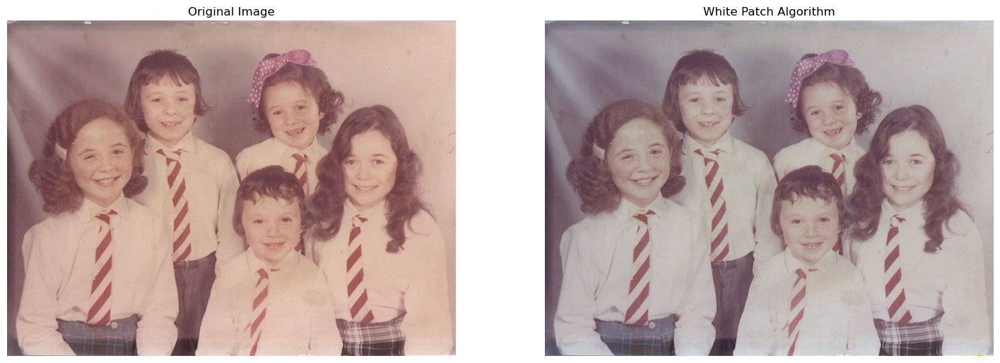

In [48]:
# Juxtaposition of the original and enhanced image through white patch algorithm
plt.figure(figsize=[18,12])

# Original image
plt.subplot(121)
plt.title('Original Image')
plt.imshow(old_img)
plt.axis('off')

# Contrast stretched image
plt.subplot(122)
plt.title('White Patch Algorithm')
plt.imshow(I_wb)
plt.axis('off')
plt.savefig('/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/Act1/whitepatch.png', dpi = 300, bbox_inches='tight')
plt.show()

In [49]:
print(f'R channel: {np.sum(I_wb[:,:,0])}, G channel: {np.sum(I_wb[:,:,1])}, B channel: {np.sum(I_wb[:,:,2])}')

R channel: 78738744, G channel: 71675666, B channel: 72585194


**As we can see from above, the white patch algorithm used a white patch as a reference for color correction in the original image. However, since red had the highest pixel mean originally, it retained as the color channel having the highest value in the enhanced image even after the increase in the averages of the other color channels. Still, this is a much better approach in contrast to the results of contrast stretching.**